<a href="https://www.kaggle.com/code/arihantdebnath/distracted-driver?scriptVersionId=206373202" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## ML Project
# Distracted Driver Recognition Using Support Vector Machine with Convolutional Neural Networks for Feature Extraction and Principal Component Analysis for Feature Reduction. 

#### Project by: 
ARIHANT DEBNATH [RA2211003011033] <br>
DIVA MERJA [RA2211003011034] <br>
MAKADIA YAKSH VIJAYAKUMAR[RA2211003011035] <br>
KRISHNA WADHWANI[RA2211003011045] <br>

<br>
Reference Paper: https://ejurnal.undana.ac.id/index.php/jicon/article/view/12658 <br>
Dataset: https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/data <br>
Reference Code: https://www.kaggle.com/code/achmadyunedaalfajr/skripsi-05-22-2023-svm-pca-scrath-cnn-lib-v4 
<br>

In [9]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [10]:
# Import dataset
state_farm_distracted_driver_detection_path = kagglehub.competition_download('state-farm-distracted-driver-detection')

print('Data source import complete.')


Data source import complete.


# Importing Libraries

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import itertools
import pandas as pd
import glob
import pickle
import os
import time
from keras.models import Sequential, save_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.utils import check_random_state
from tqdm import tqdm

# Loading the Dataset

In [12]:
main_path = '/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c'
class_labels = []
images = []

# Iterates for each class
for class_index in range(10):
    class_path = main_path + str(class_index)  # Path to the current class directory
    for root, dirs, files in os.walk(class_path):
        # Process files in the current class
        for filename in tqdm(files, desc='Processing class ' + str(class_index)):
            image_path = os.path.join(class_path, filename)
            img = cv2.imread(image_path)
            img = cv2.resize(img, (100, 100)) / 255
            images.append(img)
            class_labels.append(class_index)

Processing class 9: 100%|██████████| 2129/2129 [00:20<00:00, 103.07it/s]


# Data Preprocessing

## Train Test Split

In [13]:
train_images, test_images, train_labels, test_labels = train_test_split(np.array(images), np.array(class_labels), test_size = 0.2, shuffle=True)

## Feature Extraction using a CNN

In [14]:
# Define the custom CNN architecture
cnn = Sequential()
cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Conv2D(64, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Conv2D(128, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Flatten())
cnn.add(Dense(256, activation='relu'))
cnn.add(Dense(128, activation='relu'))
cnn.add(Dense(10, activation='softmax'))

# Compile the model
cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [15]:
cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,404,490 (12.99 MB)

 Trainable params: 3,404,490 (12.99 MB)

 Non-trainable params: 0 (0.00 B)

## One Hot Encoding 
[Read more](https://machinelearningmastery.com/why-one-hot-encode-data-in-machine-learning/)

In [16]:
# Encode the target labels as one-hot vectors
train_labels_encoded = to_categorical(train_labels, num_classes=10)
test_labels_encoded = to_categorical(test_labels, num_classes=10)

cnn.fit(train_images, train_labels_encoded, epochs=10, batch_size=32, validation_data=(test_images, test_labels_encoded))

Epoch 1/10


I0000 00:00:1731252416.027837     101 service.cc:145] XLA service 0x7ee8680054c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731252416.027905     101 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 22/561 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.0960 - loss: 2.3320

I0000 00:00:1731252418.861354     101 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


561/561 ━━━━━━━━━━━━━━━━━━━━ 14s 17ms/step - accuracy: 0.5665 - loss: 1.2002 - val_accuracy: 0.9708 - val_loss: 0.1185
Epoch 2/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9812 - loss: 0.0634 - val_accuracy: 0.9741 - val_loss: 0.1001
Epoch 3/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9885 - loss: 0.0358 - val_accuracy: 0.9882 - val_loss: 0.0571
Epoch 4/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9912 - loss: 0.0242 - val_accuracy: 0.9784 - val_loss: 0.0771
Epoch 5/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9913 - loss: 0.0286 - val_accuracy: 0.9864 - val_loss: 0.0639
Epoch 6/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9920 - loss: 0.0277 - val_accuracy: 0.9920 - val_loss: 0.0461
Epoch 7/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9956 - loss: 0.0178 - val_accuracy: 0.9904 - val_loss: 0.0536
Epoch 8/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9958 - loss: 0.0139 - val_accuracy: 0.9868 - va

**Removing the final Fully Connected Layer to get the 128 features extracted from the previous layer.**

In [17]:
# Remove the last layer from the CNN model
cnn = Sequential(cnn.layers[:-1])

# Preventing the weights from being updated
for layer in cnn.layers:
    layer.trainable = False

In [18]:
cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,403,200 (12.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 3,403,200 (12.98 MB)

### Extracted Features

In [19]:
train_features = cnn.predict(train_images)
test_features = cnn.predict(test_images)

561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [20]:
print(train_features.shape)
print(test_features.shape)

(17939, 128)
(4485, 128)


## Feature Reduction using PCA

**Here, we will reduce the extracted features(128) to 16 features using Principle Component Analysis.**
[Learn More](https://www.youtube.com/watch?v=FgakZw6K1QQ)

### PCA Implementation

In [21]:
class PCA:
    def __init__(self, n_components):
        self.n_components = n_components
        self.components = None
        self.mean = None

    def fit(self, X):
        # Calculate the mean of each feature
        self.mean = np.mean(X, axis=0)

        # Center the data by subtracting the mean from each feature
        X = X - self.mean

        # Calculate the covariance matrix
        cov = np.cov(X.T)

        # Calculate the eigenvalues and eigenvectors of the covariance matrix
        eigenvalues, eigenvectors = np.linalg.eig(cov)

        # Sort the eigenvectors by their corresponding eigenvalues in descending order
        eigenvectors = eigenvectors.T
        idxs = np.argsort(eigenvalues)[::-1]
        eigenvectors = eigenvectors[idxs]
        eigenvalues = eigenvalues[idxs]

        # Store the first n_components eigenvectors as the components
        self.components = eigenvectors[0:self.n_components]

    def transform(self, X):
        # Center the data by subtracting the mean from each feature
        X = X - self.mean

        # Project the data onto the components
        return np.dot(X, self.components.T)

    def fit_transform(self, X):
        # Calculate the mean of each feature
        self.mean = np.mean(X, axis=0)

        # Center the data by subtracting the mean from each feature
        X = X - self.mean

        # Calculate the covariance matrix
        cov = np.cov(X.T)

        # Calculate the eigenvalues and eigenvectors of the covariance matrix
        eigenvalues, eigenvectors = np.linalg.eig(cov)

        # Sort the eigenvectors by their corresponding eigenvalues in descending order
        eigenvectors = eigenvectors.T
        idxs = np.argsort(eigenvalues)[::-1]
        eigenvectors = eigenvectors[idxs]
        eigenvalues = eigenvalues[idxs]

        # Store the first n_components eigenvectors as the components
        self.components = eigenvectors[0:self.n_components]

        # Project the data onto the components
        return np.dot(X, self.components.T)

### Applying PCA

In [22]:
# Create a PCA object with 16 components
pca = PCA(n_components=16)
train_features_reduced = pca.fit_transform(train_features)
test_features_reduced = pca.transform(test_features)

In [23]:
print(train_features_reduced.shape)
print(test_features_reduced.shape)

(17939, 16)
(4485, 16)


### Saving the reduced features

In [24]:
train_features_reduced_save = pd.DataFrame(train_features_reduced)
train_features_reduced_save.to_csv('train_features_reduced_save.csv', index=False)

In [25]:
test_features_reduced_save = pd.DataFrame(test_features_reduced)
test_features_reduced_save.to_csv('test_features_reduced_save.csv', index=False)

In [26]:
train_tar_save = pd.DataFrame(train_labels)
train_tar_save.to_csv('train_tar.csv', index=False)

In [27]:
test_tar_save = pd.DataFrame(test_labels)
test_tar_save.to_csv('test_tar.csv', index=False)

In [28]:
print(train_features_reduced[0])

[-10.78187462   6.07341428  -9.53527301   5.80357458  10.39433815
  -5.47110045   6.77571109  -1.37967757  -3.54279894   1.4917794
  -3.1642719    5.70300598   1.34105572  -1.94733702   0.33690559
  -0.47913042]


In [29]:
print(test_features_reduced[0])

[ 5.49738296  0.13553807  2.48715275  6.13888217 -9.10283845 -6.83186968
  0.59509522 -8.72095092  0.76649367 -5.25367562  1.01185493  3.09936433
 -3.67273733  1.44846791  2.80840023 -0.96995538]


# Classification

## 1. Support Vector Machine(SVM)

### 1.1 SVM - Our Implementation

In [30]:
class SVM:
    def __init__(self, C=1, max_iter=50, tol=0.05,
                 random_state=None, verbose=0):
        self.C = C
        self.max_iter = max_iter
        self.tol = tol,
        self.random_state = random_state
        self.verbose = verbose

    def projection_simplex(self, v, z=1):
        n_features = v.shape[0]
        u = np.sort(v)[::-1]
        cssv = np.cumsum(u) - z
        ind = np.arange(n_features) + 1
        cond = u - cssv / ind > 0
        rho = ind[cond][-1]
        theta = cssv[cond][-1] / float(rho)
        w = np.maximum(v - theta, 0)
        return w

    def _partial_gradient(self, X, y, i):
        # Partial gradient for the ith sample.
        g = np.dot(X[i], self.coef_.T) + 1
        g[y[i]] -= 1
        return g

    def _violation(self, g, y, i):
        # Optimality violation for the ith sample.
        smallest = np.inf
        for k in range(g.shape[0]):
            if k == y[i] and self.dual_coef_[k, i] >= self.C:
                continue
            elif k != y[i] and self.dual_coef_[k, i] >= 0:
                continue

            smallest = min(smallest, g[k])

        return g.max() - smallest

    def _solve_subproblem(self, g, y, norms, i):
        # Prepare inputs to the projection.
        Ci = np.zeros(g.shape[0])
        Ci[y[i]] = self.C
        beta_hat = norms[i] * (Ci - self.dual_coef_[:, i]) + g / norms[i]
        z = self.C * norms[i]

        # Compute projection onto the simplex.
        beta = self.projection_simplex(beta_hat, z)

        return Ci - self.dual_coef_[:, i] - beta / norms[i]

    def fit(self, X, y):
        n_samples, n_features = X.shape

        n_classes = np.unique(y).size
        self.dual_coef_ = np.zeros((n_classes, n_samples), dtype=np.float64)
        self.coef_ = np.zeros((n_classes, n_features))

        # Pre-compute norms.
        norms = np.sqrt(np.sum(X ** 2, axis=1))

        # Shuffle sample indices.
        rs = check_random_state(self.random_state)
        ind = np.arange(n_samples)
        rs.shuffle(ind)

        violation_init = None
        for it in range(self.max_iter):
            violation_sum = 0

            for ii in range(n_samples):
                i = ind[ii]

                # All-zero samples can be safely ignored.
                if norms[i] == 0:
                    continue

                g = self._partial_gradient(X, y, i)
                v = self._violation(g, y, i)
                violation_sum += v

                if v < 1e-12:
                    continue

                # Solve subproblem for the ith sample.
                delta = self._solve_subproblem(g, y, norms, i)

                # Update primal and dual coefficients.
                self.coef_ = self.coef_.astype(np.complex128)
                self.dual_coef_ = self.dual_coef_.astype(np.complex128)
                delta = delta.astype(np.complex128)

                self.coef_ += np.multiply(delta[:, np.newaxis], X[i][:, np.newaxis].conj().T)
                self.dual_coef_[:, i] += delta

            if it == 0:
                violation_init = violation_sum

            vratio = violation_sum / violation_init

            if vratio < self.tol:
                if self.verbose >= 1:
                    print("Converged")
                break

        return self

    def predict(self, X):
        decision = np.dot(X, self.coef_.T)
        return decision.argmax(axis=1)

### SVM with PCA

In [31]:
svm = SVM(C=1, tol=0.001, max_iter=100, random_state=0, verbose=1)

start_time = time.time()
svm.fit(train_features_reduced, train_labels)
end_time = time.time()

training_duration = end_time - start_time
print("Training duration:", training_duration, "seconds")

predictions = svm.predict(test_features_reduced)
accuracy = np.mean(predictions == test_labels)
print("Accuracy:", accuracy)

Training duration: 55.66868877410889 seconds
Accuracy: 0.9901895206243032


### SVM without PCA

In [32]:
svm_no_pca = SVM(C=1, tol=0.001, max_iter=100, random_state=0, verbose=1)

start_time_no_pca = time.time()
svm_no_pca.fit(train_features, train_labels)
end_time_no_pca = time.time()

training_duration_no_pca = end_time_no_pca - start_time_no_pca
print("Training duration without PCA:", training_duration_no_pca, "seconds")

predictions_no_pca = svm_no_pca.predict(test_features)
accuracy_no_pca = np.mean(predictions_no_pca == test_labels)
print("Accuracy without PCA:", accuracy_no_pca)

Training duration without PCA: 67.17785739898682 seconds
Accuracy without PCA: 0.9924191750278707


### 1.2 SVM from sklearn library 
[Documentation](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html)

#### SVM with PCA

In [33]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Create an SVM classifier with a linear kernel
svm_sklearn = SVC(kernel='linear', C=1, max_iter=100, random_state=0, verbose=0)

# Train the SVM classifier on the reduced features (with PCA)
start_time_svm_sklearn = time.time()
svm_sklearn.fit(train_features_reduced, train_labels)
end_time_svm_sklearn = time.time()

training_duration_svm_sklearn = end_time_svm_sklearn- start_time_svm_sklearn
print("Training duration with PCA:", training_duration_svm_sklearn, "seconds")

# Predict the labels for the test set
predictions_svm_sklearn = svm_sklearn.predict(test_features_reduced)
accuracy_svm_sklearn = accuracy_score(test_labels, predictions_svm_sklearn)
print("Accuracy with PCA:", accuracy_svm_sklearn)

Training duration with PCA: 0.12885665893554688 seconds
Accuracy with PCA: 0.9906354515050168


/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


#### SVM without PCA

In [34]:
# Train the SVM classifier on the original features (without PCA)
start_time_svm_sklearn_no_pca = time.time()
svm_sklearn.fit(train_features, train_labels)
end_time_svm_sklearn_no_pca = time.time()

training_duration_svm_sklearn_no_pca = end_time_svm_sklearn_no_pca - start_time_svm_sklearn_no_pca
print("Training duration without PCA:", training_duration_svm_sklearn_no_pca, "seconds")

# Predict the labels for the test set
predictions_svm_sklearn_no_pca = svm_sklearn.predict(test_features)
accuracy_svm_sklearn_no_pca = accuracy_score(test_labels, predictions_svm_sklearn_no_pca)
print("Accuracy without PCA:", accuracy_svm_sklearn_no_pca)

Training duration without PCA: 0.3041558265686035 seconds
Accuracy without PCA: 0.9917502787068004


/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


## SVM Model Evaluation

### 1. Confusion Matrix
[Learn More](https://towardsdatascience.com/understanding-confusion-matrix-a9ad42dcfd62)

In [35]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix')

    #print(cm)
    plt.figure(figsize = (10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

Confusion matrix


<Figure size 640x480 with 0 Axes>

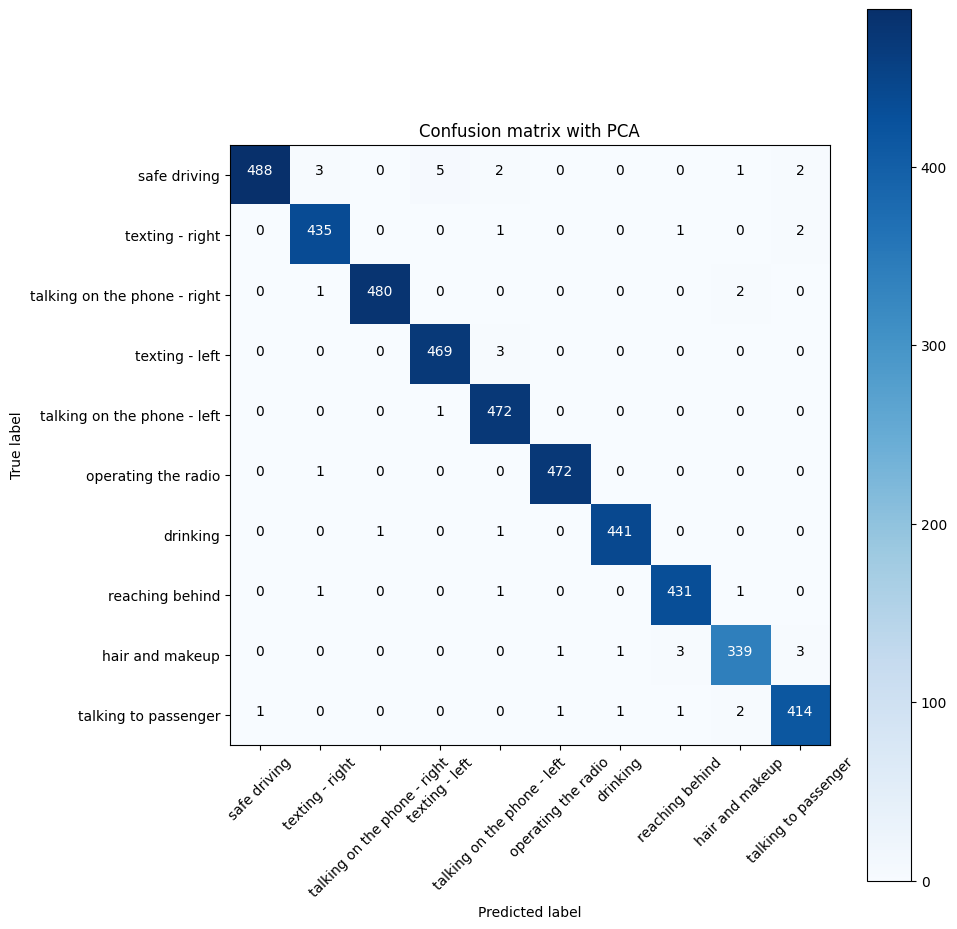

In [36]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

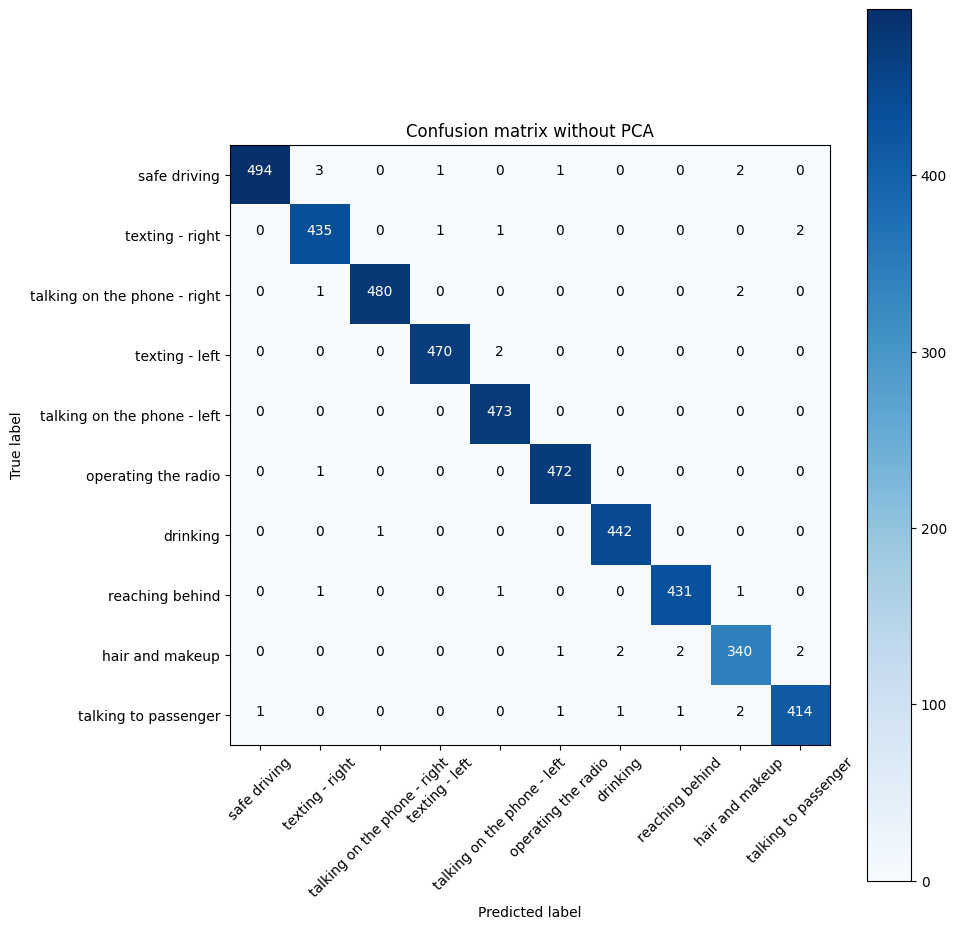

In [37]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix without PCA')

### 2. Classification Report
This is the summary of the quality of classification made by the constructed ML model. The first column is the class label’s name and followed by Precision, Recall, F1-score, and Support. 

In [38]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       1.00      0.97      0.99       501
             texting - right       0.99      0.99      0.99       439
talking on the phone - right       1.00      0.99      1.00       483
              texting - left       0.99      0.99      0.99       472
 talking on the phone - left       0.98      1.00      0.99       473
         operating the radio       1.00      1.00      1.00       473
                    drinking       1.00      1.00      1.00       443
             reaching behind       0.99      0.99      0.99       434
             hair and makeup       0.98      0.98      0.98       347
        talking to passenger       0.98      0.99      0.98       420

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [39]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       1.00      0.99      0.99       501
             texting - right       0.99      0.99      0.99       439
talking on the phone - right       1.00      0.99      1.00       483
              texting - left       1.00      1.00      1.00       472
 talking on the phone - left       0.99      1.00      1.00       473
         operating the radio       0.99      1.00      1.00       473
                    drinking       0.99      1.00      1.00       443
             reaching behind       0.99      0.99      0.99       434
             hair and makeup       0.98      0.98      0.98       347
        talking to passenger       0.99      0.99      0.99       420

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



### 3. AUC (Area Under the Curve)
AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes. Higher the AUC, the better the model is at predicting 0 classes as 0 and 1 classes as 1. <br>
[Learn More](https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5)

In [40]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions)

0.9944252351586196

In [41]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_no_pca)

0.9956169952876918

## 2. K Nearest Neighbours (KNN) 

#### KNN with PCA

In [42]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier with 5 neighbors
knn = KNeighborsClassifier(n_neighbors=5)

# Train the KNN classifier on the reduced features(with PCA)
start_time_knn = time.time()
knn.fit(train_features_reduced, train_labels)
end_time_knn = time.time() 

training_duration_knn = end_time_knn - start_time_knn
print("Training duration with PCA:", training_duration_knn, "seconds")

# Predict the labels for the test set
predictions_knn = knn.predict(test_features_reduced)
accuracy_knn = np.mean(predictions_knn == test_labels)
print("Accuracy with PCA:", accuracy_knn)

Training duration with PCA: 0.001299142837524414 seconds
Accuracy with PCA: 0.9910813823857302


#### KNN without PCA

In [43]:
# Train the KNN classifier on the original features(without PCA)
start_time_knn_no_pca = time.time()
knn.fit(train_features, train_labels)
end_time_knn_no_pca = time.time()

training_duration_knn_no_pca = end_time_knn_no_pca - start_time_knn_no_pca
print("Training duration without PCA:", training_duration_knn_no_pca, "seconds")

# Predict the labels for the test set
predictions_knn_no_pca = knn.predict(test_features)
accuracy_knn_no_pca = np.mean(predictions_knn_no_pca == test_labels)
print("Accuracy without PCA:", accuracy_knn_no_pca)

Training duration without PCA: 0.0031969547271728516 seconds
Accuracy without PCA: 0.992196209587514


## KNN Model Evaluation

### 1. Confusion Matrix

Confusion matrix


<Figure size 640x480 with 0 Axes>

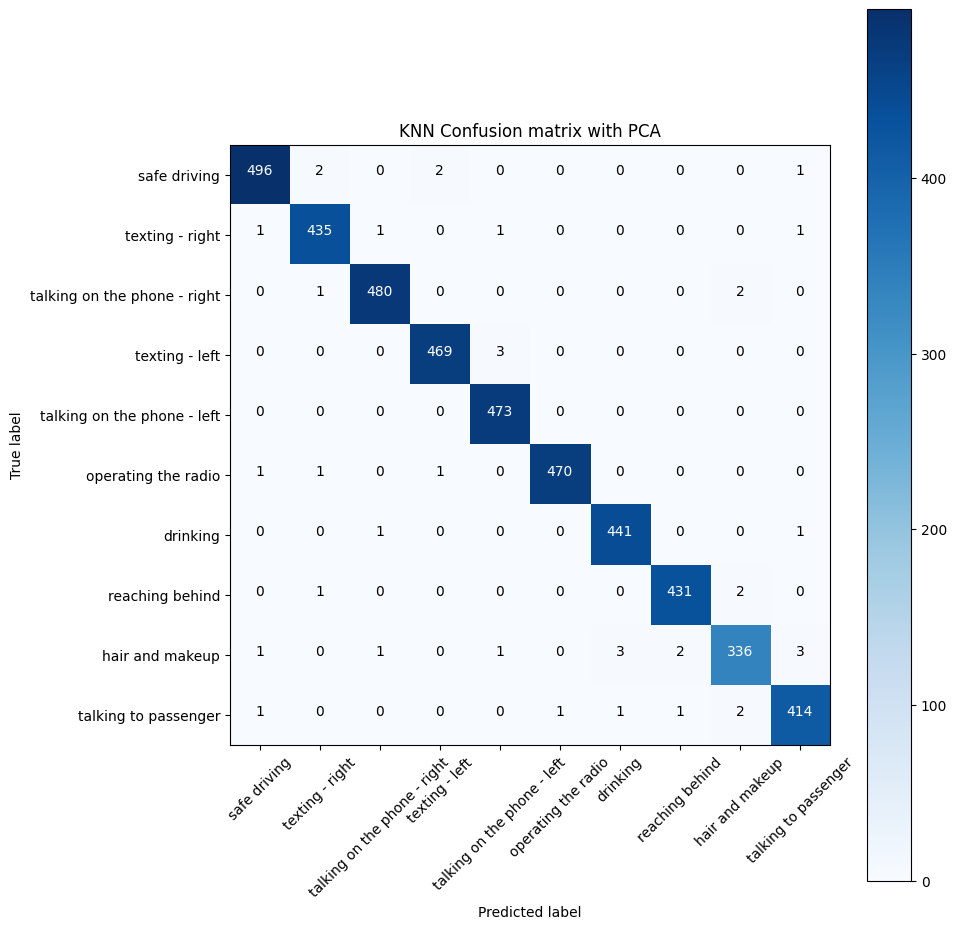

In [44]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_knn)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='KNN Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

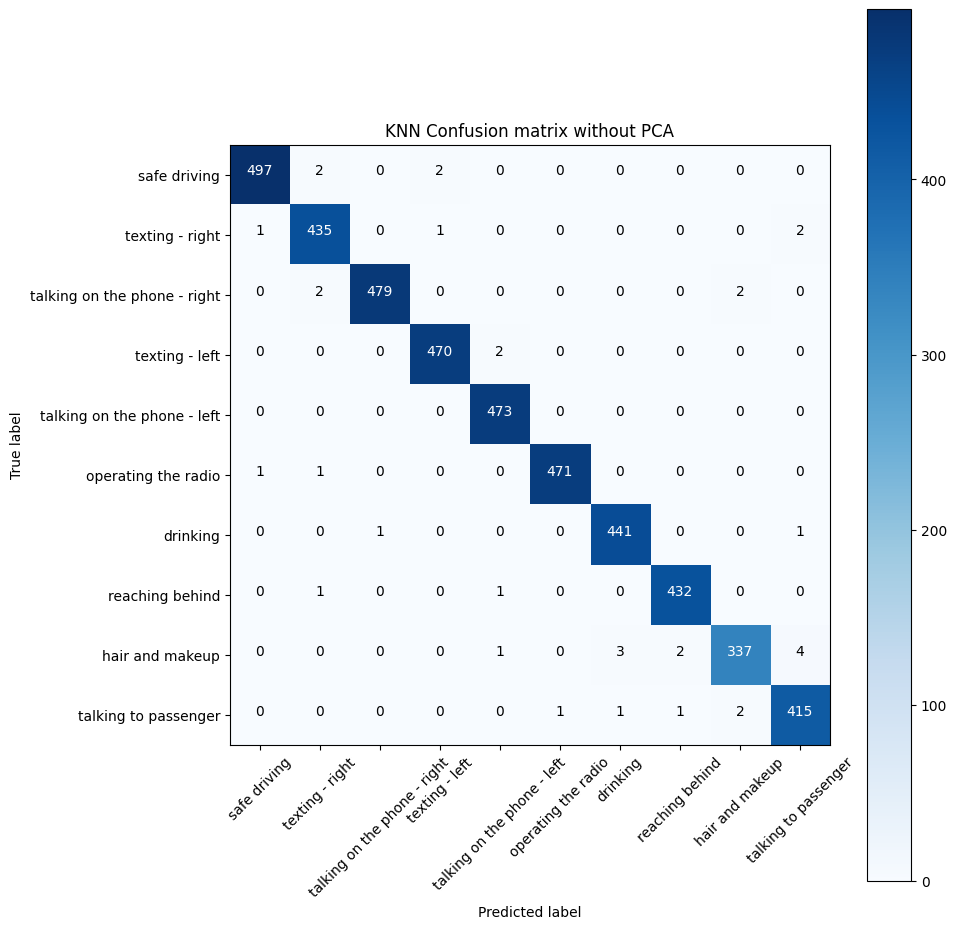

In [45]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_knn_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='KNN Confusion matrix without PCA')

### 2. Classification Report

In [46]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_knn, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.99      0.99      0.99       501
             texting - right       0.99      0.99      0.99       439
talking on the phone - right       0.99      0.99      0.99       483
              texting - left       0.99      0.99      0.99       472
 talking on the phone - left       0.99      1.00      0.99       473
         operating the radio       1.00      0.99      1.00       473
                    drinking       0.99      1.00      0.99       443
             reaching behind       0.99      0.99      0.99       434
             hair and makeup       0.98      0.97      0.98       347
        talking to passenger       0.99      0.99      0.99       420

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [47]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_knn_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       1.00      0.99      0.99       501
             texting - right       0.99      0.99      0.99       439
talking on the phone - right       1.00      0.99      0.99       483
              texting - left       0.99      1.00      0.99       472
 talking on the phone - left       0.99      1.00      1.00       473
         operating the radio       1.00      1.00      1.00       473
                    drinking       0.99      1.00      0.99       443
             reaching behind       0.99      1.00      0.99       434
             hair and makeup       0.99      0.97      0.98       347
        talking to passenger       0.98      0.99      0.99       420

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



### 3. AUC

In [48]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_knn)

0.9947348473523562

In [49]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_knn_no_pca)

0.9953831745193744

## 3. Random Forest

In [50]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Create a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=0)

# Train the Random Forest classifier on the reduced features(with PCA)
start_time_rf = time.time()
rf.fit(train_features_reduced, train_labels)
end_time_rf = time.time()

training_duration_rf = end_time_rf - start_time_rf
print("Training duration with PCA:", training_duration_rf, "seconds")

# Predict the labels for the test set
predictions_rf = rf.predict(test_features_reduced)
accuracy_rf = accuracy_score(test_labels, predictions_rf)
print("Accuracy with PCA:", accuracy_rf)

Training duration with PCA: 5.825235843658447 seconds
Accuracy with PCA: 0.9892976588628762


In [51]:
# Train the Random Forest classifier on the original features(without PCA)
start_time_rf_no_pca = time.time()
rf.fit(train_features, train_labels)
end_time_rf_no_pca = time.time()

training_duration_rf_no_pca = end_time_rf_no_pca - start_time_rf_no_pca
print("Training duration without PCA:", training_duration_rf_no_pca, "seconds")

# Predict the labels for the test set
predictions_rf_no_pca = rf.predict(test_features)
accuracy_rf_no_pca = accuracy_score(test_labels, predictions_rf_no_pca)
print("Accuracy without PCA:", accuracy_rf_no_pca)

Training duration without PCA: 6.508006811141968 seconds
Accuracy without PCA: 0.9919732441471572


## Random Forrest Model Evaluation

### 1. Confusion Matrix

Confusion matrix


<Figure size 640x480 with 0 Axes>

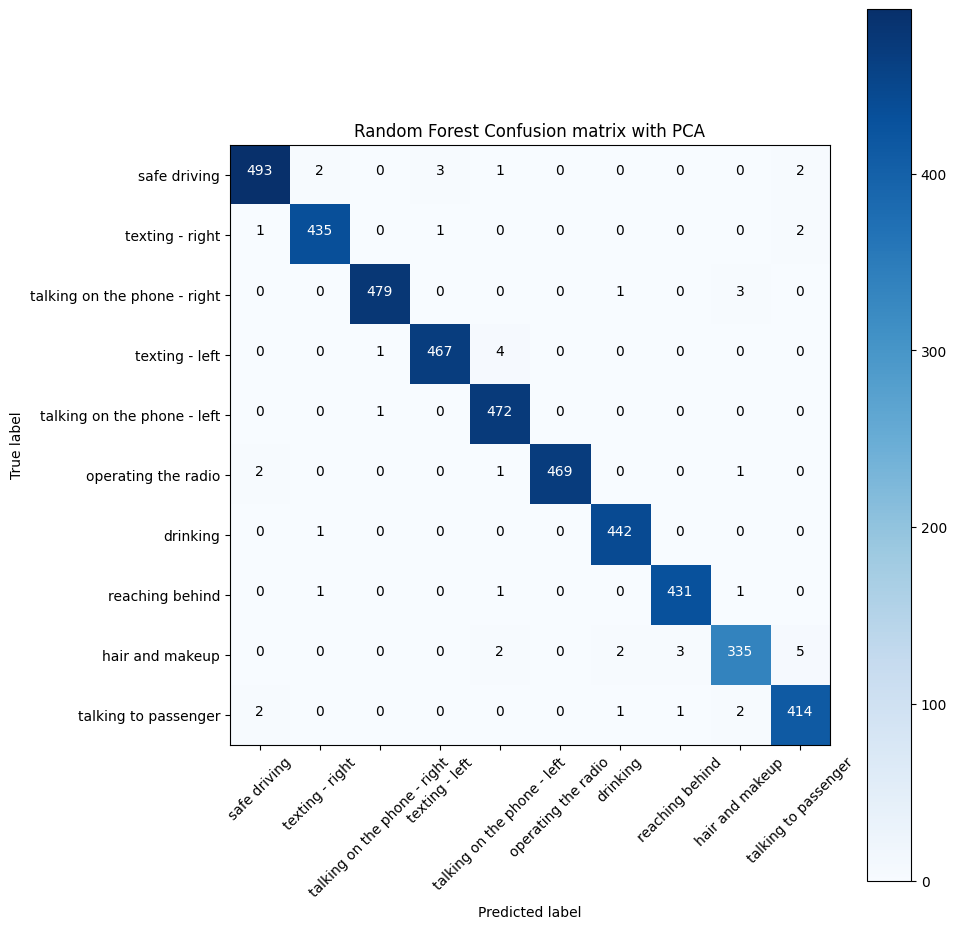

In [52]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_rf)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Random Forest Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

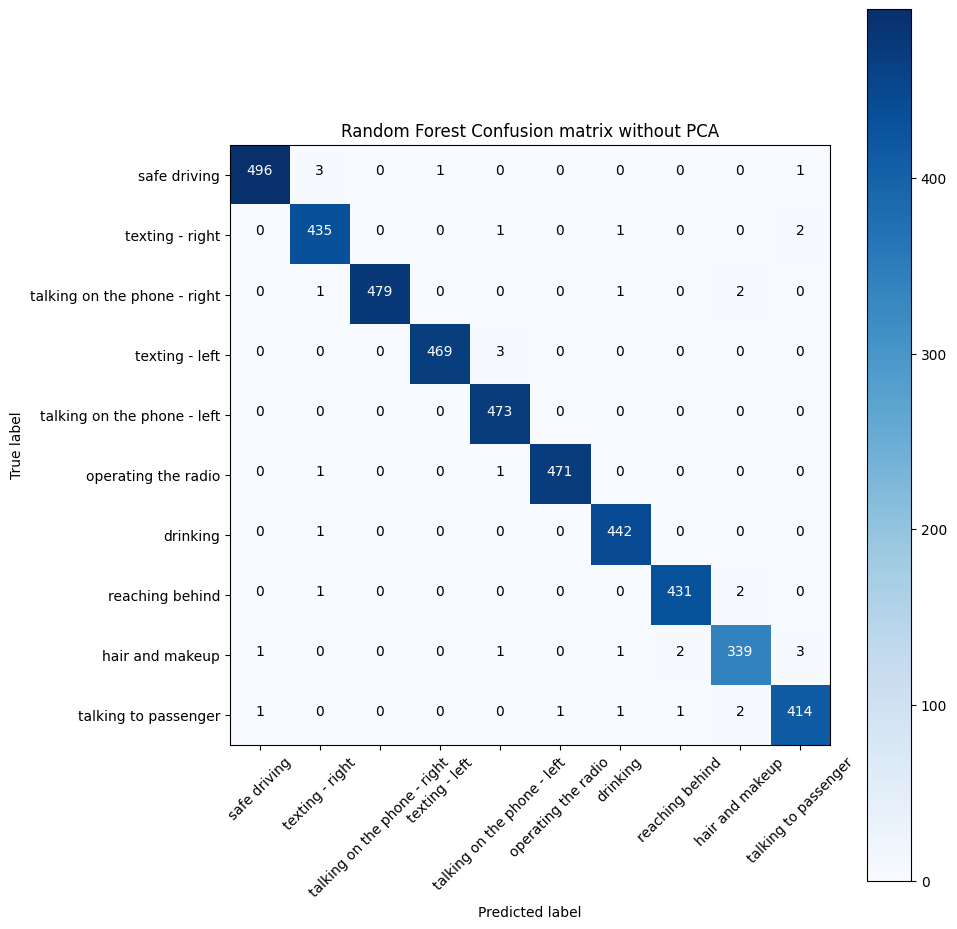

In [53]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_rf_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Random Forest Confusion matrix without PCA')

### 2. Classification Report

In [54]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_rf, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.99      0.98      0.99       501
             texting - right       0.99      0.99      0.99       439
talking on the phone - right       1.00      0.99      0.99       483
              texting - left       0.99      0.99      0.99       472
 talking on the phone - left       0.98      1.00      0.99       473
         operating the radio       1.00      0.99      1.00       473
                    drinking       0.99      1.00      0.99       443
             reaching behind       0.99      0.99      0.99       434
             hair and makeup       0.98      0.97      0.97       347
        talking to passenger       0.98      0.99      0.98       420

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [55]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_rf_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       1.00      0.99      0.99       501
             texting - right       0.98      0.99      0.99       439
talking on the phone - right       1.00      0.99      1.00       483
              texting - left       1.00      0.99      1.00       472
 talking on the phone - left       0.99      1.00      0.99       473
         operating the radio       1.00      1.00      1.00       473
                    drinking       0.99      1.00      0.99       443
             reaching behind       0.99      0.99      0.99       434
             hair and makeup       0.98      0.98      0.98       347
        talking to passenger       0.99      0.99      0.99       420

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



### 3. AUC

In [56]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_rf)

0.99377854814804

In [57]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_rf_no_pca)

0.9953325016964385

## Comparative Analysis 

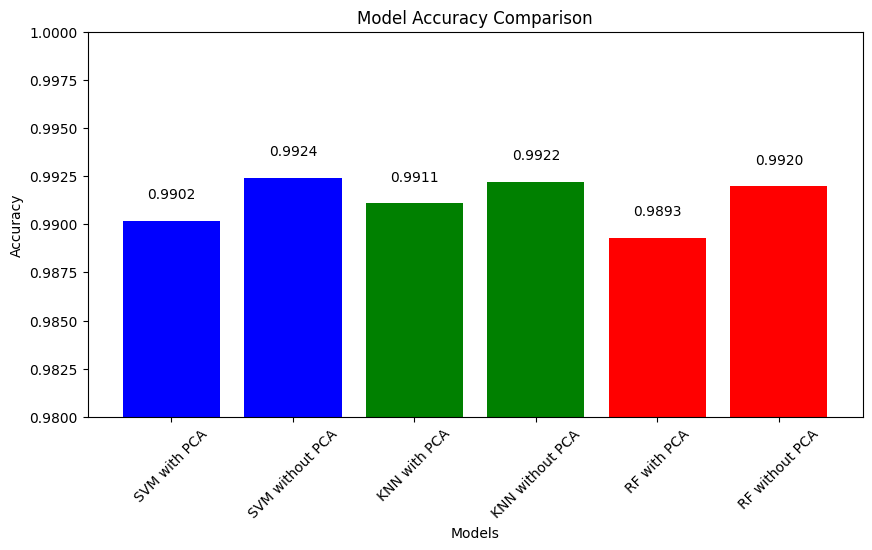

In [73]:
import matplotlib.pyplot as plt

# Model names
models = ['SVM with PCA', 'SVM without PCA', 'KNN with PCA', 'KNN without PCA', 'RF with PCA', 'RF without PCA']

# Accuracy values
accuracies = [accuracy, accuracy_no_pca, accuracy_knn, accuracy_knn_no_pca, accuracy_rf, accuracy_rf_no_pca]

# Training durations
training_durations = [training_duration, training_duration_no_pca, training_duration_knn, training_duration_knn_no_pca, training_duration_rf, training_duration_rf_no_pca]

# Plotting accuracies
plt.figure(figsize=(10, 5))
plt.bar(models, accuracies, color=['blue', 'blue', 'green', 'green', 'red', 'red'])
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.xticks(rotation=45)
plt.ylim(0.98, 1)

# Adding accuracy values on top of the bars
for i, v in enumerate(accuracies):
    plt.text(i, v + 0.001, f"{v:.4f}", ha='center', va='bottom')
    
plt.show()

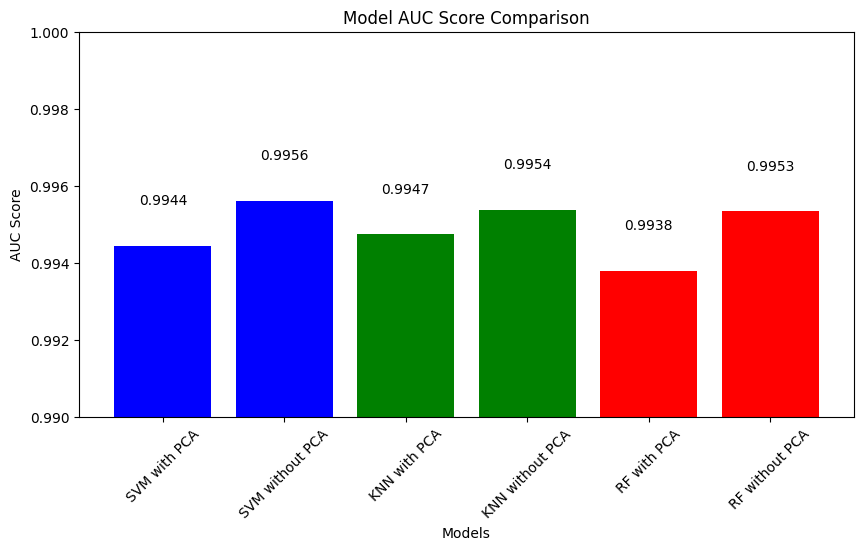

In [74]:
# AUC scores
auc_scores = [
    multiclass_roc_auc_score(test_labels, predictions),
    multiclass_roc_auc_score(test_labels, predictions_no_pca),
    multiclass_roc_auc_score(test_labels, predictions_knn),
    multiclass_roc_auc_score(test_labels, predictions_knn_no_pca),
    multiclass_roc_auc_score(test_labels, predictions_rf),
    multiclass_roc_auc_score(test_labels, predictions_rf_no_pca)
]

# Plotting AUC scores
plt.figure(figsize=(10, 5))
plt.bar(models, auc_scores, color=['blue', 'blue', 'green', 'green', 'red', 'red'])
plt.xlabel('Models')
plt.ylabel('AUC Score')
plt.title('Model AUC Score Comparison')
plt.xticks(rotation=45)
plt.ylim(0.99, 1)

# Adding AUC values on top of the bars
for i, v in enumerate(auc_scores):
    plt.text(i, v + 0.001, f"{v:.4f}", ha='center', va='bottom')
    
plt.show()

# Model Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


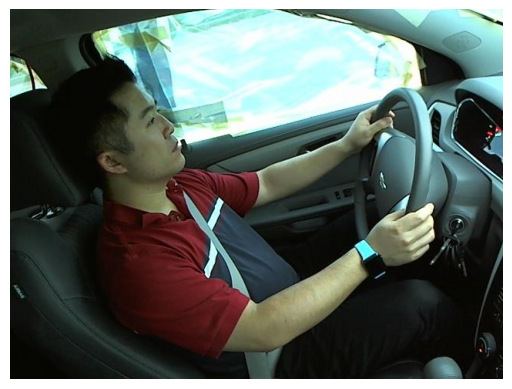

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_4824.jpg
Predicted Class: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


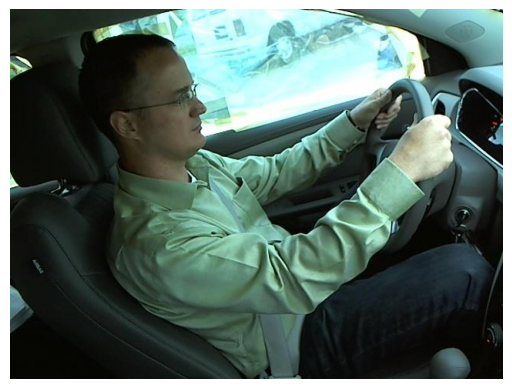

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_89655.jpg
Predicted Class: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


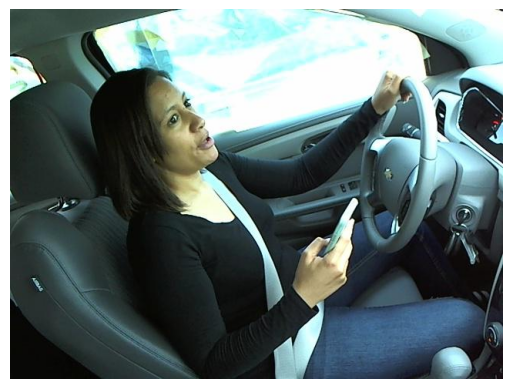

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_49562.jpg
Predicted Class: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


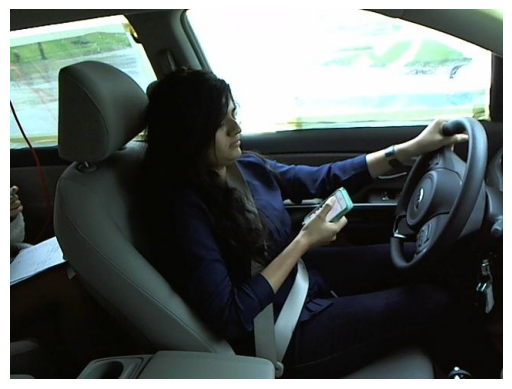

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_100155.jpg
Predicted Class: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


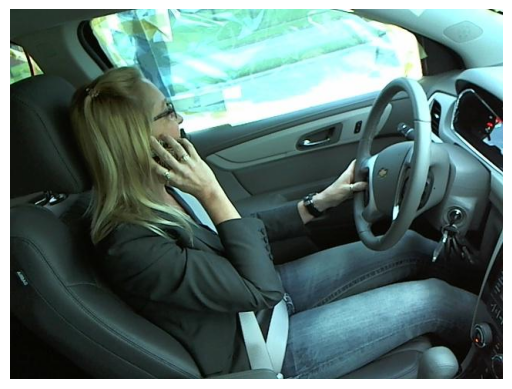

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_97201.jpg
Predicted Class: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


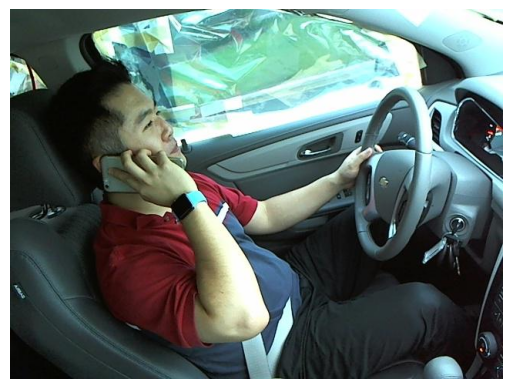

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_23922.jpg
Predicted Class: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


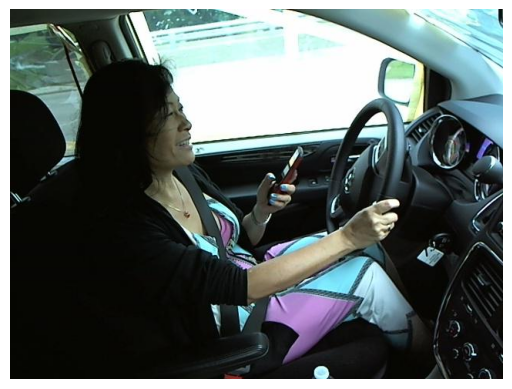

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_70516.jpg
Predicted Class: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


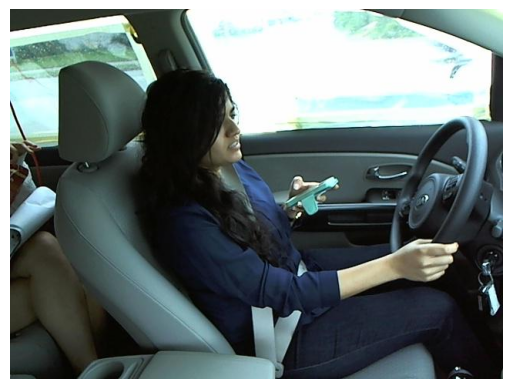

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_52453.jpg
Predicted Class: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


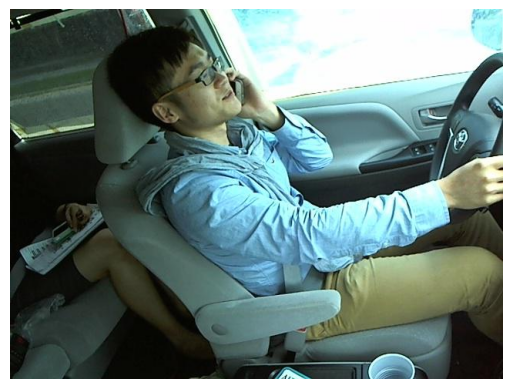

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_74399.jpg
Predicted Class: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


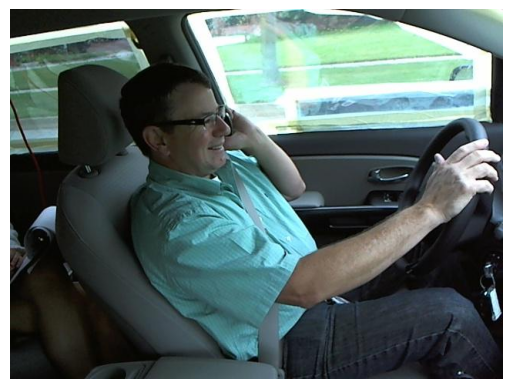

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_87040.jpg
Predicted Class: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


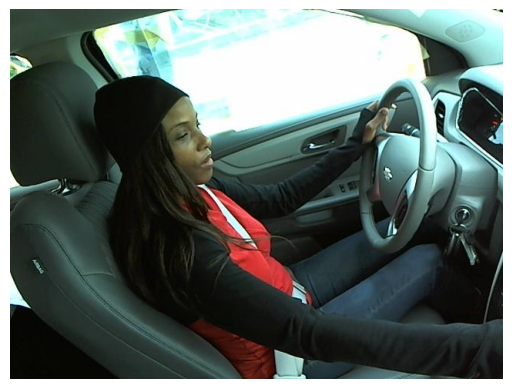

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_50697.jpg
Predicted Class: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


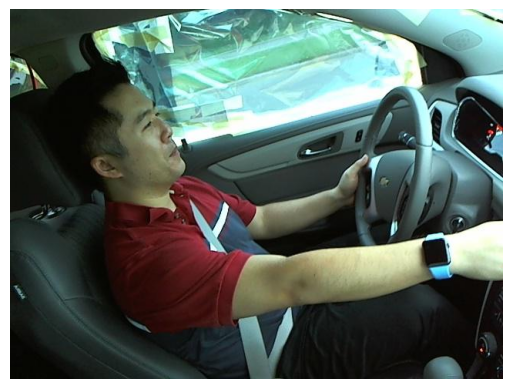

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_94090.jpg
Predicted Class: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


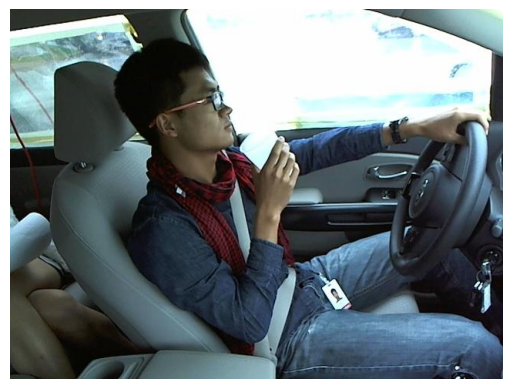

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_76463.jpg
Predicted Class: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


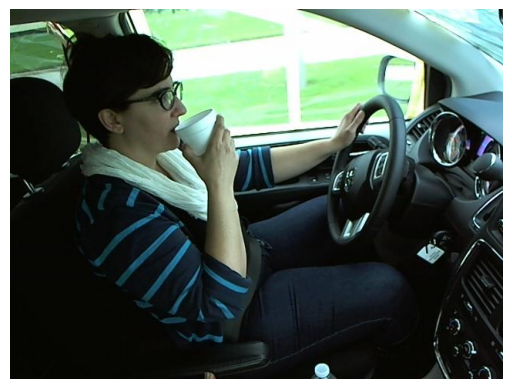

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_19089.jpg
Predicted Class: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


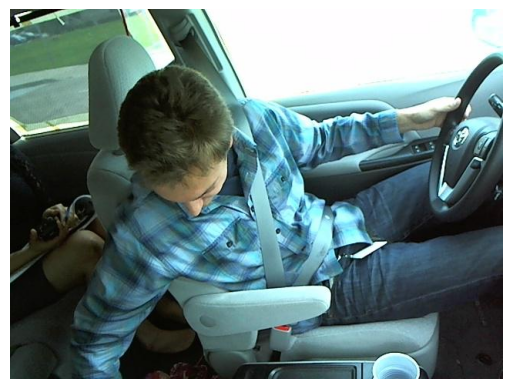

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_92068.jpg
Predicted Class: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


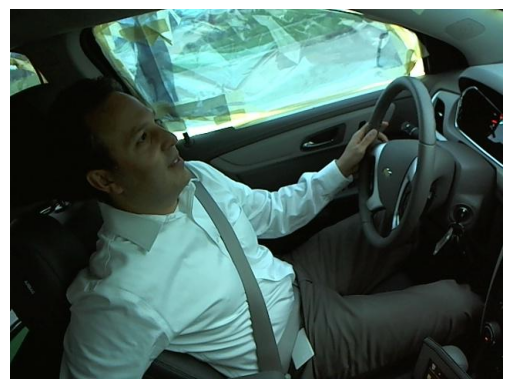

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_9657.jpg
Predicted Class: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


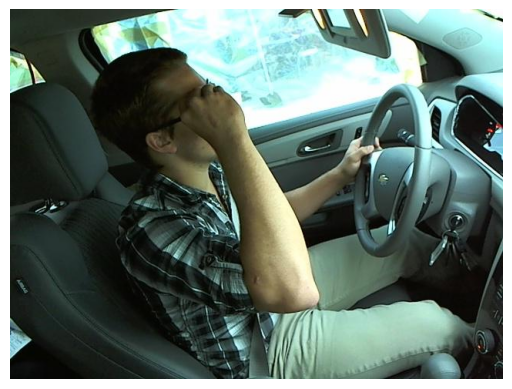

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_99945.jpg
Predicted Class: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


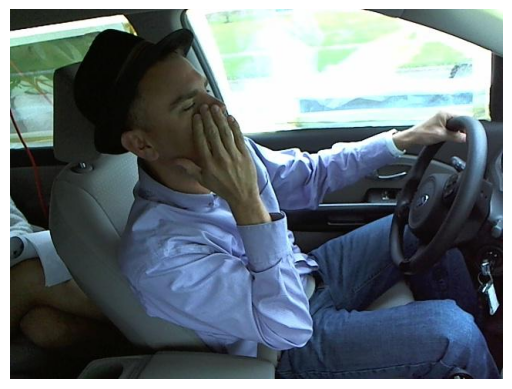

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_15160.jpg
Predicted Class: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


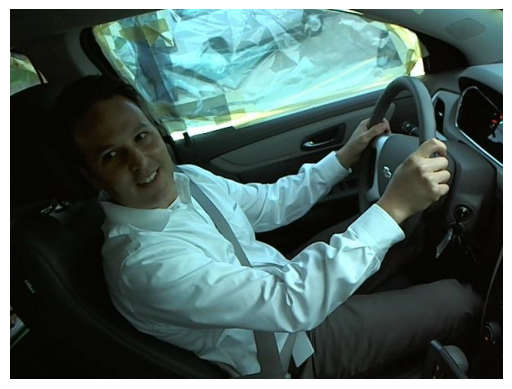

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_79317.jpg
Predicted Class: talking to passenger

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


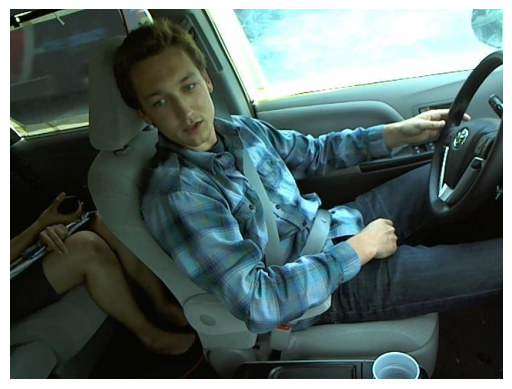

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_49712.jpg
Predicted Class: talking to passenger



In [59]:
# Define the class names
class_names_folder = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

# Number of images to display from each class
num_images_per_class = 2

# Loop through each class
for class_index in range(len(class_names_folder)):
    class_label = class_names_folder[class_index]

    # Get all image file paths in the current class folder
    image_paths = glob.glob(f'/kaggle/input/state-farm-distracted-driver-detection/imgs/train/{class_label}/*.jpg')

    # Randomly select the specified number of images from the current class
    selected_image_paths = np.random.choice(image_paths, size=num_images_per_class, replace=False)

    # Loop through the selected images in the current class
    for image_path in selected_image_paths:
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, (100, 100))/256
        images = np.array([img_resized])

        # Perform prediction
        images = cnn.predict(images)
        images = pca.transform(images)
        result = svm.predict(images)

        # Display the original image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Print the result
        print(f"Image: {image_path}")
        print(f"Predicted Class: {class_names[result[0]]}")
        print()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


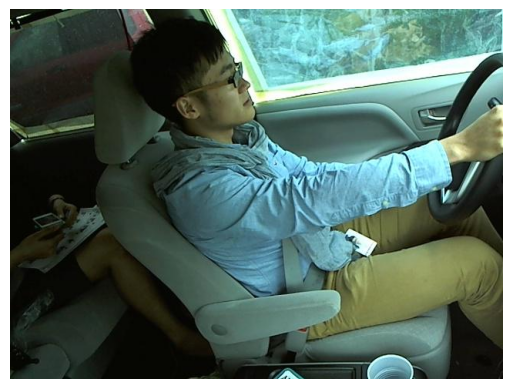

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_67875.jpg
Predicted Class without PCA: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


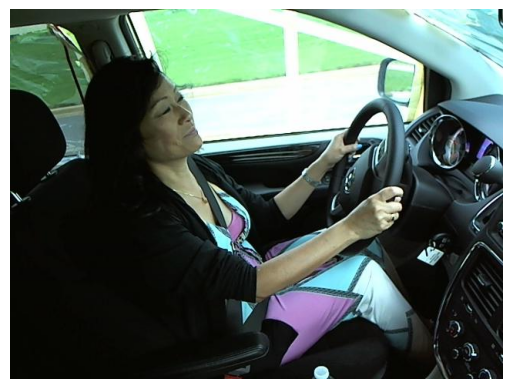

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_15890.jpg
Predicted Class without PCA: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


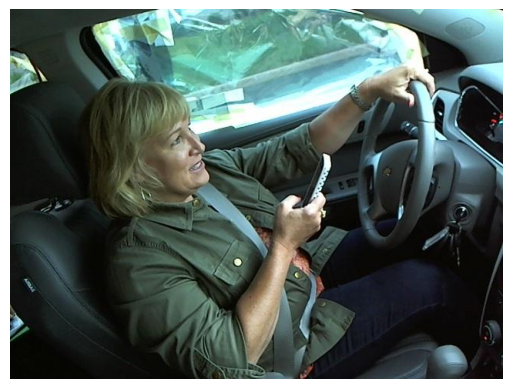

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_62292.jpg
Predicted Class without PCA: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


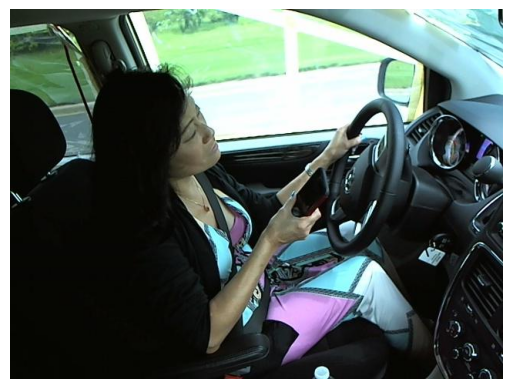

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_84328.jpg
Predicted Class without PCA: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


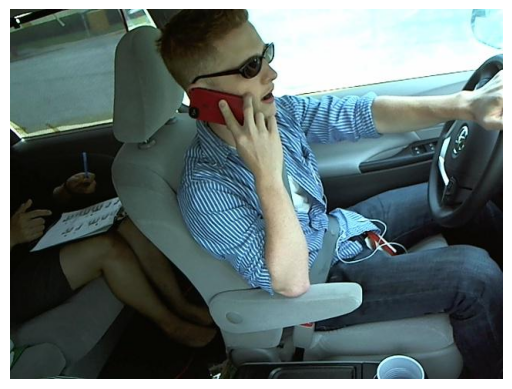

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_57358.jpg
Predicted Class without PCA: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


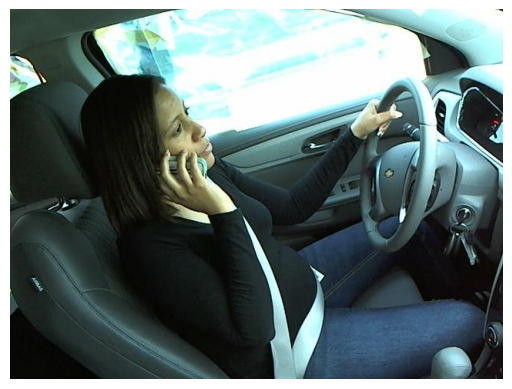

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_9953.jpg
Predicted Class without PCA: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


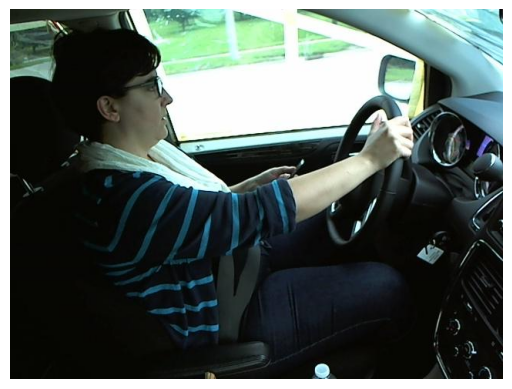

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_20178.jpg
Predicted Class without PCA: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


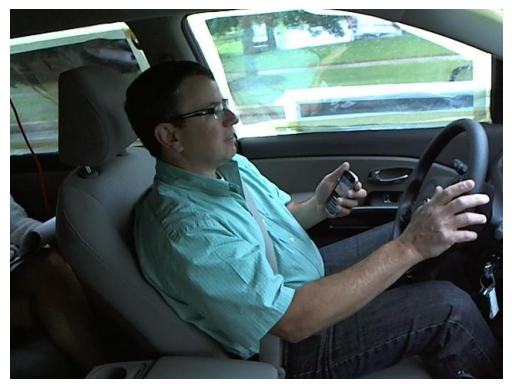

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_68634.jpg
Predicted Class without PCA: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


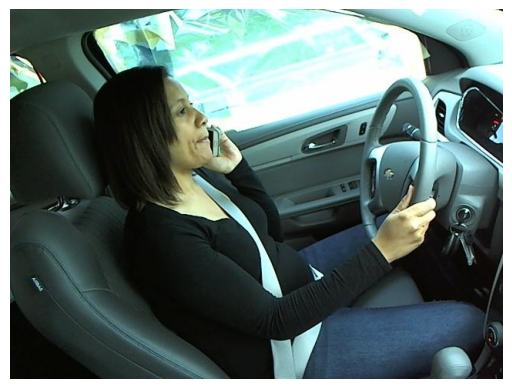

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_84751.jpg
Predicted Class without PCA: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


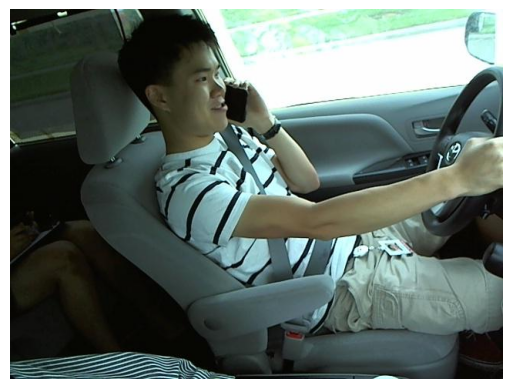

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_50372.jpg
Predicted Class without PCA: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


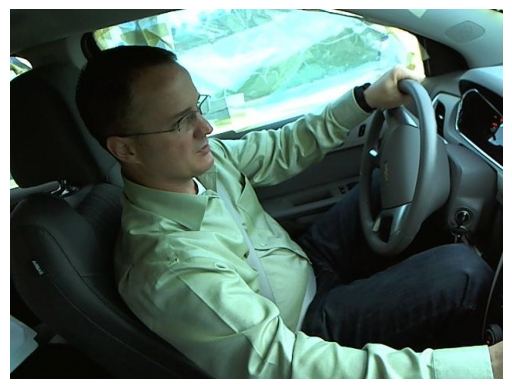

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_32000.jpg
Predicted Class without PCA: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


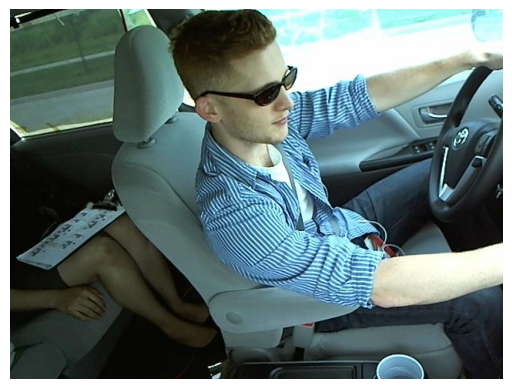

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_85337.jpg
Predicted Class without PCA: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


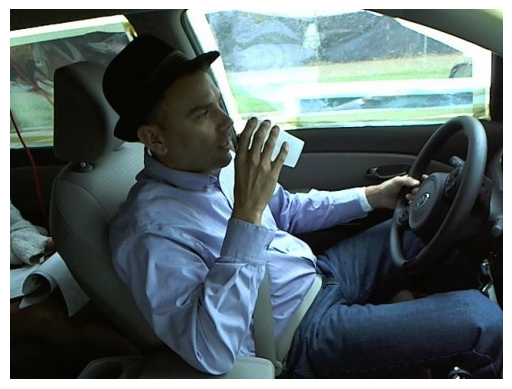

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_39854.jpg
Predicted Class without PCA: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


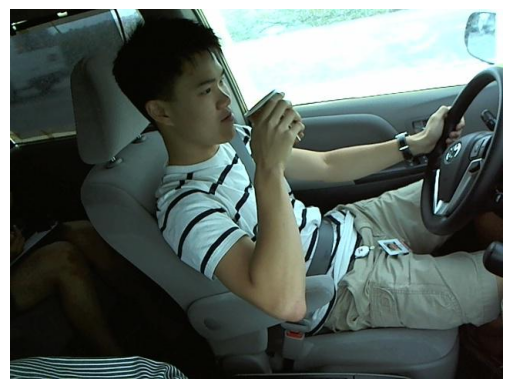

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_70260.jpg
Predicted Class without PCA: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


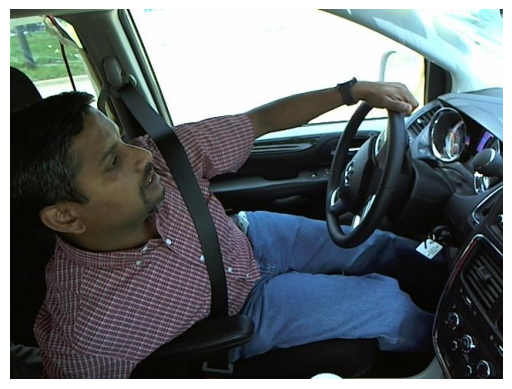

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_30367.jpg
Predicted Class without PCA: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


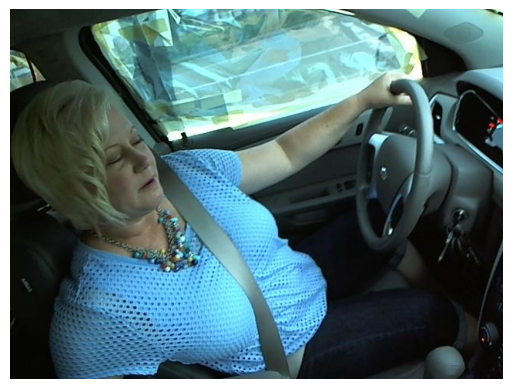

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_63031.jpg
Predicted Class without PCA: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


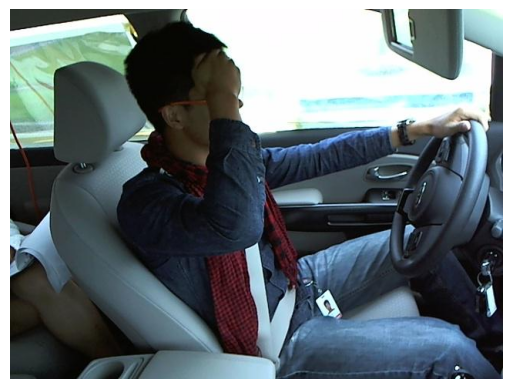

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_100787.jpg
Predicted Class without PCA: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


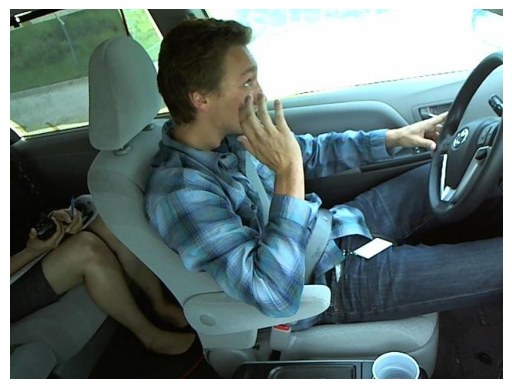

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_60740.jpg
Predicted Class without PCA: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


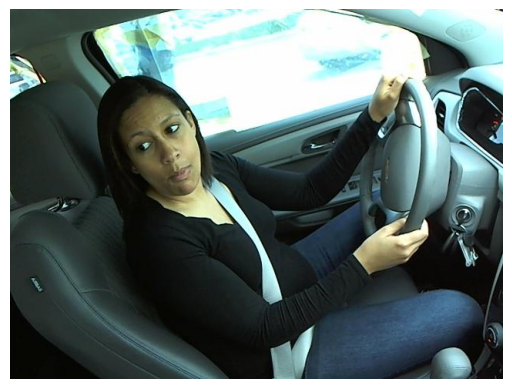

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_28640.jpg
Predicted Class without PCA: talking to passenger

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


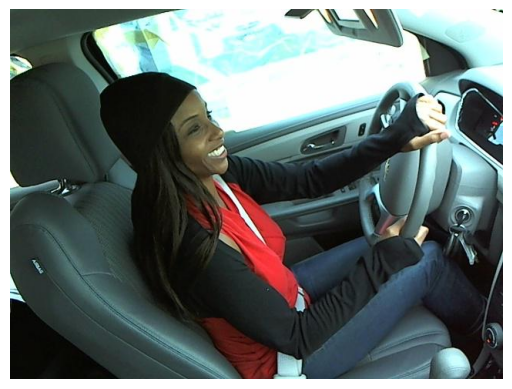

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_19346.jpg
Predicted Class without PCA: talking to passenger



In [60]:
# Define the class names
class_names_folder = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

# Number of images to display from each class
num_images_per_class = 2

# Loop through each class
for class_index in range(len(class_names_folder)):
    class_label = class_names_folder[class_index]

    # Get all image file paths in the current class folder
    image_paths = glob.glob(f'/kaggle/input/state-farm-distracted-driver-detection/imgs/train/{class_label}/*.jpg')

    # Randomly select the specified number of images from the current class
    selected_image_paths = np.random.choice(image_paths, size=num_images_per_class, replace=False)

    # Loop through the selected images in the current class
    for image_path in selected_image_paths:
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, (100, 100))/256
        images = np.array([img_resized])

        # Perform prediction
        images = cnn.predict(images)
        result = svm_no_pca.predict(images)

        # Display the original image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Print the result
        print(f"Image: {image_path}")
        print(f"Predicted Class without PCA: {class_names[result[0]]}")
        print()

# Saving the Model Files

In [61]:
with open('svm_manual_bisa_v4.4.pkl', 'wb') as f:
    pickle.dump(svm, f)
with open('svm_manual_bisa_v4.4_no_pca.pkl', 'wb') as f:
    pickle.dump(svm_no_pca, f)
with open('pca_manual_bisa_v4.4.pkl', 'wb') as f:
    pickle.dump(pca, f)
cnn.save('/kaggle/working/cnn_bisa_v4.4.h5')